In [1]:
#@title Required Installations
!pip install swig
!pip install gymnasium
!pip install mujoco
!pip install gymnasium[mujoco]
!pip install stable-baselines3[extra]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 22.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.9/953.9 kB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 54.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 208.2/208.2 kB 27.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 434.7/434.7 kB 37.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 68.5 MB/s eta 0:00:00
  Created wheel for AutoROM.accept-rom-license: filename=AutoROM.accept_rom_license-0.6.1-py3-none-any.whl size=446660 sha256=aca6184e3fa56a903ba2a669cdf1b15ca42e8177921e8b55cb88fcfd527646dc
  Stored in directory: /root/.cache/pip/wheels/6b/1b/ef/a43ff1a2f1736d5711faa1ba4c1f61be1131b8899e6a057811

In [2]:
#@title Check if installation was successful

from google.colab import files

import distutils.util
import os
import subprocess
if subprocess.run('nvidia-smi').returncode:
  raise RuntimeError(
      'Cannot communicate with GPU. '
      'Make sure you are using a GPU Colab runtime. '
      'Go to the Runtime menu and select Choose runtime type.')

# Add an ICD config so that glvnd can pick up the Nvidia EGL driver.
# This is usually installed as part of an Nvidia driver package, but the Colab
# kernel doesn't install its driver via APT, and as a result the ICD is missing.
# (https://github.com/NVIDIA/libglvnd/blob/master/src/EGL/icd_enumeration.md)
NVIDIA_ICD_CONFIG_PATH = '/usr/share/glvnd/egl_vendor.d/10_nvidia.json'
if not os.path.exists(NVIDIA_ICD_CONFIG_PATH):
  with open(NVIDIA_ICD_CONFIG_PATH, 'w') as f:
    f.write("""{
    "file_format_version" : "1.0.0",
    "ICD" : {
        "library_path" : "libEGL_nvidia.so.0"
    }
}
""")

# Configure MuJoCo to use the EGL rendering backend (requires GPU)
print('Setting environment variable to use GPU rendering:')
%env MUJOCO_GL=egl

try:
  print('Checking that the installation succeeded:')
  import mujoco
  mujoco.MjModel.from_xml_string('<mujoco/>')
except Exception as e:
  raise e from RuntimeError(
      'Something went wrong during installation. Check the shell output above '
      'for more information.\n'
      'If using a hosted Colab runtime, make sure you enable GPU acceleration '
      'by going to the Runtime menu and selecting "Choose runtime type".')

print('Installation successful.')

Setting environment variable to use GPU rendering:
env: MUJOCO_GL=egl
Checking that the installation succeeded:
Installation successful.


In [3]:
import gymnasium as gym
import stable_baselines3
import mujoco

env = gym.make('CartPole-v1', render_mode="rgb_array")

/usr/local/lib/python3.10/dist-packages/torch/utils/tensorboard/__init__.py:4: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if not hasattr(tensorboard, "__version__") or LooseVersion(


In [4]:
#@title Import packages for plotting and creating graphics
import time
import itertools
import numpy as np
from typing import Callable, NamedTuple, Optional, Union, List

# Graphics and plotting.
print('Installing mediapy:')
!command -v ffmpeg >/dev/null || (apt update && apt install -y ffmpeg)
!pip install -q mediapy
import mediapy as media
import matplotlib.pyplot as plt

# More legible printing from numpy.
np.set_printoptions(precision=3, suppress=True, linewidth=100)

Installing mediapy:
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 29.8 MB/s eta 0:00:00


In [6]:
from stable_baselines3.dqn.dqn import DQN
import os
#train models using policy
models_dir = "cartPole/models/DQN"

if not os.path.exists(models_dir):
    os.makedirs(models_dir)


cartPoleDQNModel = DQN(
    'MlpPolicy',
   env = env,
    learning_rate= 2.3e-3,
    batch_size=64,
    buffer_size=100000,
    learning_starts=1000,
    gamma= 0.99,
    target_update_interval=10,
    train_freq=256,
    gradient_steps=128,
    exploration_fraction=0.16,
    exploration_final_eps=0.04,
    policy_kwargs= dict(net_arch=[256, 256]),
    verbose = 1
)


#customdqn = DQN(
  #  'MlpPolicy',
 #   env = env
#)
TIMESTEPS = 5e4
cartPoleDQNModel.learn(total_timesteps=TIMESTEPS, progress_bar=True)
cartPoleDQNModel.save(f"{models_dir}/" + "CartPole_DQN_MODEL")


Output()

Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.5     |
|    ep_rew_mean      | 11.5     |
|    exploration_rate | 0.994    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 392      |
|    time_elapsed     | 0        |
|    total_timesteps  | 46       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 17.5     |
|    exploration_rate | 0.983    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 1056     |
|    time_elapsed     | 0        |
|    total_timesteps  | 140      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 17.9  

In [ ]:
from matplotlib.colors import Normalize
from stable_baselines3 import PPO
import os
#train models using policy
models_dir = "cartPole/models/PPO"

if not os.path.exists(models_dir):
    os.makedirs(models_dir)


ppoModel = PPO(
    'MlpPolicy',
    env = env
)

TIMESTEPS = 200000
ppoModel.learn(total_timesteps=TIMESTEPS,progress_bar = True)
ppoModel.save(f"{models_dir}/CartPole_PPO_MODEL")

Output()

In [ ]:
from matplotlib.colors import Normalize
from stable_baselines3 import A2C
import os
#train models using policy
models_dir = "cartPole/models/A2C"

if not os.path.exists(models_dir):
    os.makedirs(models_dir)


ppoModel = A2C(
    'MlpPolicy',
    env = env
)

TIMESTEPS = 200000
ppoModel.learn(total_timesteps=TIMESTEPS,progress_bar = True)
ppoModel.save(f"{models_dir}/CartPole_PPO_MODEL")

In [ ]:
#Load The Model
from stable_baselines3.dqn.dqn import DQN
from stable_baselines3.ppo import PPO
env.reset()
cartPoleDQNModel_path = "cartPole/models/DQN/CartPole_DQN_MODEL"
cartPolePPOModel_path = "cartPole/models/PPO/CartPole_PPO_MODEL"
cartPoleDQNModel = DQN.load(cartPoleDQNModel_path, env=env)
cartPolePPOModel = PPO.load(cartPolePPOModel_path, env=env)




Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
#Evaluate Policy for CartPole DQN and PPO
from stable_baselines3.common.evaluation import evaluate_policy
cartPole_DQN_episodes_rewards,cartPole_DQN_episodes_length= evaluate_policy(cartPoleDQNModel, cartPoleDQNModel.get_env(), n_eval_episodes=100,return_episode_rewards=True)
cartPole_PPO_episodes_rewards,cartPole_PPO_episodes_length= evaluate_policy(cartPolePPOModel, cartPolePPOModel.get_env(), n_eval_episodes=100,return_episode_rewards=True)

print('Mean reward DQN CartPole ='+str(np.mean(cartPole_DQN_episodes_rewards)))
print('MAX reward DQN CartPole='+str(np.max(cartPole_DQN_episodes_rewards)))
print('Mean Reward PPO cartpole '+str(np.mean(cartPole_PPO_episodes_rewards)))
print('Max Reward PPO CartPole'+str(np.max(cartPole_PPO_episodes_rewards)))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Mean reward DQN CartPole =500.0
MAX reward DQN CartPole=500.0
Mean Reward PPO cartpole 500.0
Max Reward PPO CartPole500.0


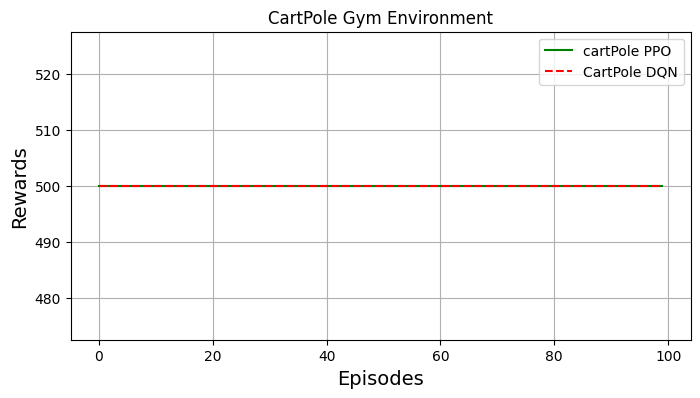

In [ ]:
#Plotting Episode vs Rewards for CARTPOLE
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 4))
plt.title('CartPole Gym Environment')
plt.plot(cartPole_PPO_episodes_rewards,label="cartPole PPO",color="green",ls='-')
plt.plot(cartPole_DQN_episodes_rewards,label="CartPole DQN",color="red",ls='--')
plt.xlabel("Episodes", fontsize=14)
plt.ylabel("Rewards", fontsize=14)
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
#render video for cartpole
duaration = 5 # time - seconds
framerate = 60 # FPS

frames = [] # Empty list to append frames to

DQNRewards=[]
episodes = 100
observation,info=env.reset()

for ep in range(episodes):
   done=False
   dqnrewardSum=0

   while(not done and dqnrewardSum<500):
    action,_states =  cartPoleDQNModel.predict(observation)
    observation, reward, done, truncated, info = env.step(action)
    dqnrewardSum=dqnrewardSum+reward
    px = env.render()
    frames.append(px)
   if done or truncated:
      DQNRewards.append(dqnrewardSum)
      observation,info = env.reset()


env.close()

media.show_video(frames, fps=60)

In [7]:
env2 = gym.make('Humanoid-v4', render_mode="rgb_array")

In [ ]:
from stable_baselines3.sac import SAC
import os
#train models using policy
models_dir = "humanoid/models/SAC"

if not os.path.exists(models_dir):
    os.makedirs(models_dir)


customSAC = SAC(
    'MlpPolicy',
    learning_starts=10000,
    env = env2
)
TIMESTEPS = 2e6
iters = 0
customSAC.learn(total_timesteps=TIMESTEPS,progress_bar=True)
customSAC.save(f"{models_dir}/" + "_Humanoid_SAC")


In [ ]:
from stable_baselines3.td3 import TD3
import os
#train models using policy
models_dir = "humanoid/models/TD3"

if not os.path.exists(models_dir):
    os.makedirs(models_dir)


td3Custom = TD3(
    'MlpPolicy',
    env = env2,
    batch_size= 256,
    buffer_size=1000000,
    gamma= 0.99,
    learning_rate=0.0003,
    learning_starts=25000.0,
    seed=1,
    tau=0.005)

TIMESTEPS = 1000000
iters = 0


td3Custom.learn(total_timesteps=TIMESTEPS,progress_bar=True)
td3Custom.save(f"{models_dir}/" + "_Humanoid_TD3")


In [8]:
#Load The Models for Humanoid
#Load The Models
from stable_baselines3.sac import SAC
env2.reset()
humanoidSACModel_path = "humanoid/models/SAC/_Humanoid_SAC"
humanoidSACModel = SAC.load(humanoidSACModel_path, env=env2)
humanoidTD3Model_path = "humanoid/models/TD3/_Humanoid_TD3"
humanoidTd3Model = SAC.load(humanoidSACModel_path, env=env2)





In [ ]:
from stable_baselines3.common.evaluation import evaluate_policy
humanoid_SAC_episodes_rewards,humanoid_SAC_episodes_length=evaluate_policy(humanoidSACModel, humanoidSACModel.get_env(), n_eval_episodes=100,return_episode_rewards=True)
humanoid_TD_episodes_rewards,humanoid_TD_episodes_length=evaluate_policy(humanoidTd3Model, humanoidTd3Model.get_env(), n_eval_episodes=100,return_episode_rewards=True)
print('humanoid SAC Mean Episode Rewards='+str(np.mean(humanoid_SAC_episodes_rewards)))
print('humanoid SAC max Episode Rewards='+str(np.max(humanoid_SAC_episodes_rewards)))
print('humanoid TD3 Mean Episode Rewards='+str(np.mean(humanoid_TD_episodes_rewards)))
print('humanoid TD3 max Episode Rewards='+str(np.max(humanoid_TD_episodes_rewards)))


humanoid SAC Mean Episode Rewards=6196.09795645
humanoid SAC max Episode Rewards=6389.983389
humanoid TD3 Mean Episode Rewards=6097.634069579999
humanoid TD3 max Episode Rewards=6393.690802


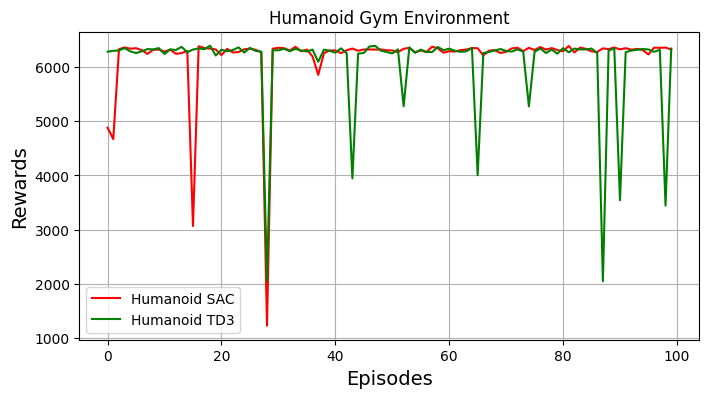

In [ ]:
#Plotting Episode vs Rewards for CARTPOLE
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 4))
plt.title('Humanoid Gym Environment')
plt.plot(humanoid_SAC_episodes_rewards,label="Humanoid SAC",color="red",ls='-')
plt.plot(humanoid_TD_episodes_rewards,label="Humanoid TD3",color="green",ls='-')
plt.xlabel("Episodes", fontsize=14)
plt.ylabel("Rewards", fontsize=14)
plt.legend()
plt.grid(True)
plt.show()

In [9]:
#render video for humanoid
duaration = 5 # time - seconds
framerate = 60 # FPS

frames = [] # Empty list to append frames to

sacRewards=[]
episodes = 1000
observation,info=env2.reset()

for ep in range(episodes):
   sacrewardSum=0
   action,_states =  humanoidSACModel.predict(observation)
   observation, reward, done, truncated, info = env2.step(action)
   sacrewardSum=sacrewardSum+reward
   px = env2.render()
   frames.append(px)
   if done or truncated:
      sacRewards.append(sacrewardSum)
      observation,info = env2.reset()


env2.close()

media.show_video(frames, fps=60)